In [1]:
import geopandas as gpd
import pandas as pd


from shapely.ops import unary_union, linemerge
from shapely.geometry import Point, LineString, MultiLineString
from shapely.geometry import mapping


import networkx as nx


import folium
from folium import Map, GeoJson




### Berlin einlesen für Proof of concept

<Axes: >

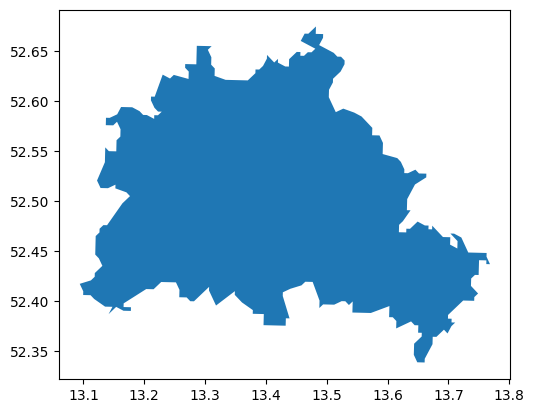

In [2]:
bland = gpd.read_file("https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/2_bundeslaender/1_sehr_hoch.geo.json")
bland_fil=bland[bland["id"].isin(["DE-BE"])]
bland_fil.plot()

### netzwerk einlesen

In [38]:
#highways=gpd.read_file("../preprocessing/processed_osm_files/processed_major_highways_germany_250528.geojson.gz")

# use not only the major highways, but all highways for this
highways=gpd.read_file("../preprocessing/processed_osm_files/processed_almostall_highways_germany_250528.geojson.gz")


In [39]:
# set defaults
highways.loc[(highways["maxspeed"].isna() | (highways["maxspeed"] == "None")) & (highways["maxspeed_type"] == "DE:urban"), "maxspeed"] = "50"
highways.loc[(highways["maxspeed"].isna() | (highways["maxspeed"] == "None")) & (highways["maxspeed_type"] == "DE:rural"), "maxspeed"] = "100"
highways

,osm_id,highway,maxspeed,maxspeed_conditional,maxspeed_backward,maxspeed_forward,maxspeed_type,name,ref,geometry
0,92,residential,30,None,None,None,None,Eigenheimstraße,None,"LINESTRING (13.73698 51.01663, 13.73752 51.016..."
1,93,residential,30,None,None,None,None,Eigenheimberg,None,"LINESTRING (13.73939 51.01669, 13.73967 51.016..."
2,99,tertiary,None,None,None,None,None,None,None,"LINESTRING (11.36639 48.17411, 11.36643 48.174..."
3,100,secondary,100,None,None,None,None,None,None,"LINESTRING (11.33037 48.1801, 11.33032 48.1801..."
4,103,residential,5,None,None,None,None,Altmockritz,None,"LINESTRING (13.74127 51.01615, 13.74149 51.016..."
...,...,...,...,...,...,...,...,...,...,...
11045659,1390550454,service,None,None,None,None,None,None,None,"LINESTRING (13.56334 52.53415, 13.56334 52.534..."
11045660,1390550455,service,None,None,None,None,None,None,None,"LINESTRING (13.56304 52.53414, 13.56303 52.534..."
11045661,1390550456,service,None,None,None,None,None,None,None,"LINESTRING (13.56203 52.53407, 13.56204 52.534..."
11045662,1390550457,service,None,None,None,None,None,None,None,"LINESTRING (13.56165 52.53405, 13.56165 52.534..."


In [40]:
## nur Berlin
highways_in_bl = gpd.clip(highways, bland_fil)
highways_in_bl

,osm_id,highway,maxspeed,maxspeed_conditional,maxspeed_backward,maxspeed_forward,maxspeed_type,name,ref,geometry
446316,24380018,residential,30,None,None,None,None,Liebknechtstraße,None,"LINESTRING (13.65769 52.33877, 13.65785 52.339..."
8849268,865871690,service,10,None,None,None,None,Wernsdorfer Straße,None,"LINESTRING (13.65925 52.33881, 13.65937 52.338..."
8559717,800638930,service,None,None,None,None,None,None,None,"LINESTRING (13.66077 52.33952, 13.66065 52.339..."
171179,10587008,unclassified,30,None,None,None,None,Moßkopfring,None,"LINESTRING (13.64705 52.34252, 13.64697 52.342..."
9385887,969836864,service,None,None,None,None,None,None,None,"LINESTRING (13.64681 52.34196, 13.64756 52.34185)"
...,...,...,...,...,...,...,...,...,...,...
6625124,389304639,track,None,None,None,None,None,None,None,"LINESTRING (13.47607 52.67116, 13.47587 52.671..."
8591380,806491145,track,None,None,None,None,None,None,None,"LINESTRING (13.47607 52.67116, 13.47616 52.671..."
4721567,197689751,track,None,None,None,None,None,None,None,"LINESTRING (13.48214 52.67267, 13.4821 52.6727..."
8907239,881562217,track,None,None,None,None,None,None,None,"LINESTRING (13.4821 52.67272, 13.48215 52.67274)"


<Axes: >

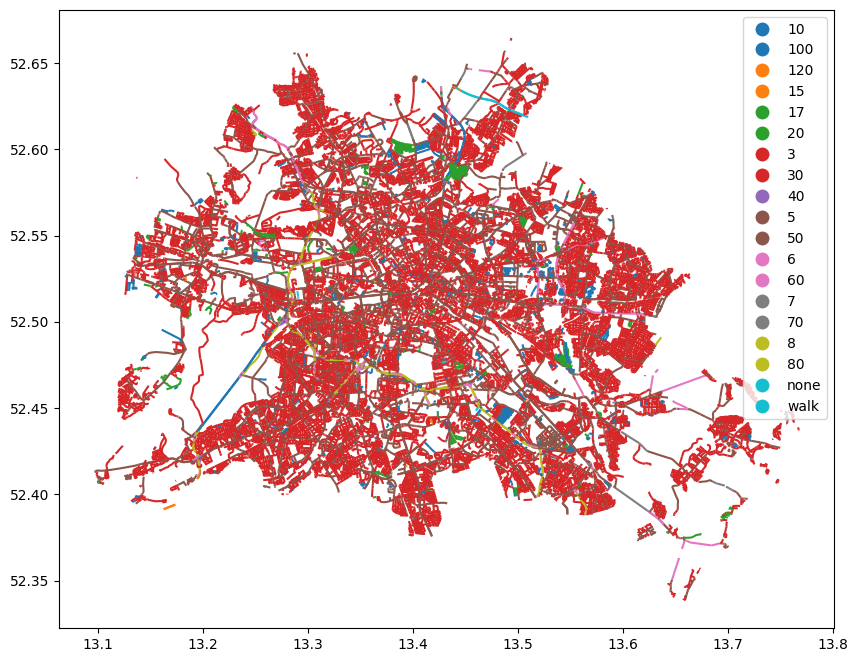

In [41]:
highways_in_bl.plot(column="maxspeed", legend=True, figsize=(10, 10))

<Axes: >

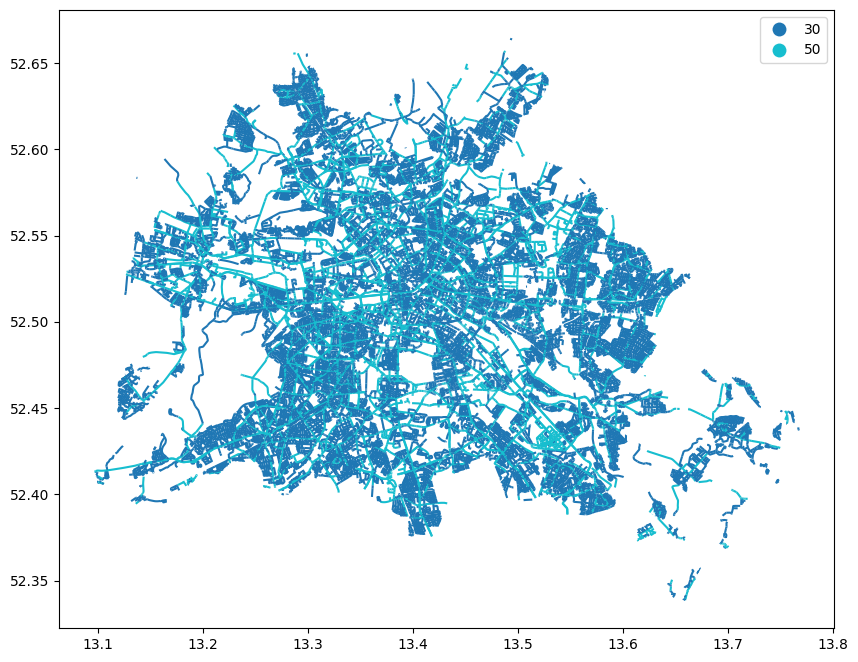

In [42]:
#nur 30 und 50 km/h

highways_in_bl_3050=highways_in_bl[highways_in_bl.maxspeed.isin(["30", "50"])].copy()
highways_in_bl_3050.plot(column="maxspeed", legend=True, figsize=(10, 10))

In [ ]:
# mapillary map feature data: traffic signs einlesen

In [21]:
mapillary_trafficsigns = gpd.read_parquet("../preprocessing/mapillary_map-feature-data_berlin_2025-06-07.parquet")
mapillary_trafficsigns

,geometry,first_seen_at,id,last_seen_at,value
0,POINT (13.09673 52.41332),2015-11-18,1391186787929268,2015-11-18,information--general-directions--g1
1,POINT (13.10878 52.41408),2015-11-18,1178445959261416,2016-03-25,warning--wild-animals--g1
2,POINT (13.0971 52.41321),2017-06-25,1696373427217755,2024-05-09,regulatory--no-parking--g1
3,POINT (13.10394 52.40669),2019-06-11,395689434851066,2019-06-11,regulatory--no-parking--g1
4,POINT (13.0961 52.41325),2015-11-18,483876509493610,2015-11-18,regulatory--maximum-speed-limit-50--g1
...,...,...,...,...,...
348888,POINT (13.75132 52.41046),2020-05-09,940194036739663,2021-09-14,regulatory--keep-right--g1
348889,POINT (13.75013 52.40777),2019-06-30,1260813321017851,2021-09-14,regulatory--shared-path-pedestrians-and-bicycl...
348890,POINT (13.75327 52.41479),2017-05-14,304906801194963,2023-04-10,regulatory--no-parking--g1
348891,POINT (13.75086 52.41488),2022-01-10,934980713814996,2022-01-10,regulatory--priority-road--g1


In [22]:
# Tempo 30 Schilder in Berlin
mapillary_trafficsigns[mapillary_trafficsigns.value=="regulatory--maximum-speed-limit-30--g1"]

,geometry,first_seen_at,id,last_seen_at,value
16,POINT (13.09577 52.41317),2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1
19,POINT (13.0984 52.41372),2015-11-18,514885479523123,2022-04-30,regulatory--maximum-speed-limit-30--g1
58,POINT (13.09609 52.41348),2018-05-05,469515337590994,2018-05-05,regulatory--maximum-speed-limit-30--g1
70,POINT (13.10911 52.41425),2022-04-30,130052272956782,2024-05-09,regulatory--maximum-speed-limit-30--g1
80,POINT (13.09625 52.41346),2018-05-05,2962802007265985,2018-05-05,regulatory--maximum-speed-limit-30--g1
...,...,...,...,...,...
348827,POINT (13.75357 52.4149),2016-07-21,2537492489881022,2023-04-10,regulatory--maximum-speed-limit-30--g1
348835,POINT (13.73848 52.41555),2023-04-10,917828369425950,2023-04-10,regulatory--maximum-speed-limit-30--g1
348844,POINT (13.75313 52.41399),2016-07-21,793872791232845,2022-01-10,regulatory--maximum-speed-limit-30--g1
348871,POINT (13.74266 52.41539),2023-04-10,701865428384592,2023-04-10,regulatory--maximum-speed-limit-30--g1


In [24]:
from datetime import datetime

def months_between(date1, date2):
    d1 = datetime.strptime(date1, "%Y-%m-%d")
    d2 = datetime.strptime(date2, "%Y-%m-%d")
    return abs((d2.year - d1.year) * 12 + d2.month - d1.month)

df_6months = mapillary_trafficsigns[
    mapillary_trafficsigns.apply(lambda row: months_between(row['first_seen_at'], row['last_seen_at']) >= 6, axis=1)
]
df_6months_30=df_6months[df_6months.value == "regulatory--maximum-speed-limit-30--g1"]

<Axes: >

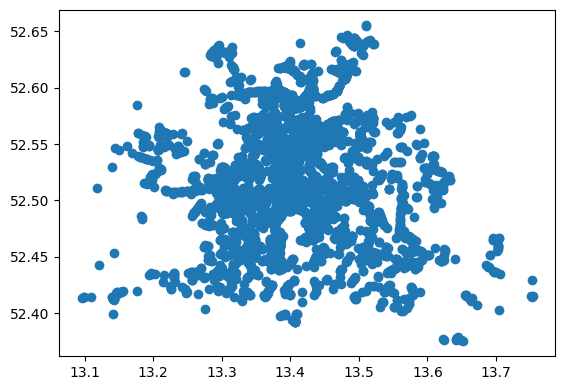

In [26]:
df_6months_30.plot()

In [27]:
df_6months_30.explore(
    tiles="CartoDB positron",
    popup=True,
    tooltip=["value", "first_seen_at", "last_seen_at"]
)

In [28]:
df_6months_30_buffered = df_6months_30.to_crs(25833).copy()
df_6months_30_buffered["geometry"] = df_6months_30_buffered.geometry.buffer(20)
df_6months_30_buffered = df_6months_30_buffered.to_crs(df_6months_30.crs)
df_6months_30_buffered

,geometry,first_seen_at,id,last_seen_at,value
16,"POLYGON ((13.09607 52.41317, 13.09607 52.41315...",2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1
19,"POLYGON ((13.09869 52.41373, 13.09869 52.41371...",2015-11-18,514885479523123,2022-04-30,regulatory--maximum-speed-limit-30--g1
70,"POLYGON ((13.1094 52.41425, 13.1094 52.41423, ...",2022-04-30,130052272956782,2024-05-09,regulatory--maximum-speed-limit-30--g1
99,"POLYGON ((13.0989 52.41373, 13.0989 52.41371, ...",2018-03-25,514100952934909,2022-06-12,regulatory--maximum-speed-limit-30--g1
483,"POLYGON ((13.11863 52.5112, 13.11863 52.51118,...",2020-04-18,561519231920106,2023-09-26,regulatory--maximum-speed-limit-30--g1
...,...,...,...,...,...
348081,"POLYGON ((13.70498 52.40236, 13.70498 52.40234...",2020-09-15,193357762649438,2022-02-26,regulatory--maximum-speed-limit-30--g1
348735,"POLYGON ((13.75259 52.42939, 13.75259 52.42937...",2015-07-01,303813858048031,2025-02-11,regulatory--maximum-speed-limit-30--g1
348827,"POLYGON ((13.75386 52.4149, 13.75386 52.41489,...",2016-07-21,2537492489881022,2023-04-10,regulatory--maximum-speed-limit-30--g1
348844,"POLYGON ((13.75343 52.414, 13.75343 52.41398, ...",2016-07-21,793872791232845,2022-01-10,regulatory--maximum-speed-limit-30--g1


In [43]:
# Spatial join: find highways_in_bl segments that intersect with buffered 30-signs
intersected = gpd.sjoin(highways_in_bl, df_6months_30_buffered, how="inner", predicate="intersects")

# Check if intersected highways have maxspeed == "30"
intersected_30 = intersected[intersected["maxspeed"] == "30"]

intersected_30

,osm_id,highway,maxspeed,maxspeed_conditional,maxspeed_backward,maxspeed_forward,maxspeed_type,name,ref,geometry,index_right,first_seen_at,id,last_seen_at,value,has_30_intersection
4721023,197671078,residential,30,None,None,None,None,Alt-Schmöckwitz,None,"LINESTRING (13.65115 52.37507, 13.65158 52.375...",346804,2016-02-17,217012846530657,2024-10-16,regulatory--maximum-speed-limit-30--g1,True
2321391,49894532,residential,30,None,None,None,DE:zone30,Marienfelder Straße,None,"LINESTRING (13.40984 52.3915, 13.40975 52.3915...",206117,2023-07-19,224626990044233,2024-09-15,regulatory--maximum-speed-limit-30--g1,True
2321391,49894532,residential,30,None,None,None,DE:zone30,Marienfelder Straße,None,"LINESTRING (13.40984 52.3915, 13.40975 52.3915...",206188,2023-07-19,224626876710911,2024-09-15,regulatory--maximum-speed-limit-30--g1,True
2321391,49894532,residential,30,None,None,None,DE:zone30,Marienfelder Straße,None,"LINESTRING (13.40984 52.3915, 13.40975 52.3915...",206260,2023-09-19,325935619966858,2025-04-22,regulatory--maximum-speed-limit-30--g1,True
2321391,49894532,residential,30,None,None,None,DE:zone30,Marienfelder Straße,None,"LINESTRING (13.40984 52.3915, 13.40975 52.3915...",205761,2017-08-22,530409321288813,2024-09-15,regulatory--maximum-speed-limit-30--g1,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319849,23228474,secondary,30,None,None,None,None,Schönerlinder Chaussee,None,"LINESTRING (13.47683 52.64429, 13.47661 52.644...",267090,2020-04-26,271461368054174,2023-05-15,regulatory--maximum-speed-limit-30--g1,True
9680164,1037070922,unclassified,30,None,None,None,None,Finkenkruger Weg,None,"LINESTRING (13.14386 52.54631, 13.14384 52.546...",1108,2022-04-30,388251449851192,2024-09-18,regulatory--maximum-speed-limit-30--g1,True
204624,14455092,tertiary,30,None,None,None,None,Am Kiesteich,None,"LINESTRING (13.16121 52.54558, 13.16141 52.545...",3731,2019-07-07,330288548597713,2024-09-18,regulatory--maximum-speed-limit-30--g1,True
1781110,37292254,residential,30,None,None,None,DE:zone30,Im Spektefeld,None,"LINESTRING (13.15695 52.54896, 13.15839 52.548...",3731,2019-07-07,330288548597713,2024-09-18,regulatory--maximum-speed-limit-30--g1,True


In [44]:
# Prüfe, ob ein highways_in_bl Segment mit maxspeed==30 oder maxspeed_conditional==30 ein df_6months_30_buffered-Polygon schneidet
def has_30_intersection(row, highways_gdf):
    # highways_gdf: nur maxspeed==30 oder maxspeed_conditional==30
    return highways_gdf.intersects(row.geometry).any()

# Filter für relevante Straßen
highways_30 = highways_in_bl[
    (highways_in_bl["maxspeed"] == "30") |
    (highways_in_bl["maxspeed_conditional"].astype(str).str.startswith("30 @"))
]

# Neue Spalte: True, falls mind. ein Segment schneidet
df_6months_30_buffered["has_30_intersection"] = df_6months_30_buffered.apply(
    lambda row: has_30_intersection(row, highways_30), axis=1
)

df_6months_30_buffered

,geometry,first_seen_at,id,last_seen_at,value,has_30_intersection
16,"POLYGON ((13.09607 52.41317, 13.09607 52.41315...",2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1,False
19,"POLYGON ((13.09869 52.41373, 13.09869 52.41371...",2015-11-18,514885479523123,2022-04-30,regulatory--maximum-speed-limit-30--g1,False
70,"POLYGON ((13.1094 52.41425, 13.1094 52.41423, ...",2022-04-30,130052272956782,2024-05-09,regulatory--maximum-speed-limit-30--g1,True
99,"POLYGON ((13.0989 52.41373, 13.0989 52.41371, ...",2018-03-25,514100952934909,2022-06-12,regulatory--maximum-speed-limit-30--g1,False
483,"POLYGON ((13.11863 52.5112, 13.11863 52.51118,...",2020-04-18,561519231920106,2023-09-26,regulatory--maximum-speed-limit-30--g1,False
...,...,...,...,...,...,...
348081,"POLYGON ((13.70498 52.40236, 13.70498 52.40234...",2020-09-15,193357762649438,2022-02-26,regulatory--maximum-speed-limit-30--g1,False
348735,"POLYGON ((13.75259 52.42939, 13.75259 52.42937...",2015-07-01,303813858048031,2025-02-11,regulatory--maximum-speed-limit-30--g1,False
348827,"POLYGON ((13.75386 52.4149, 13.75386 52.41489,...",2016-07-21,2537492489881022,2023-04-10,regulatory--maximum-speed-limit-30--g1,False
348844,"POLYGON ((13.75343 52.414, 13.75343 52.41398, ...",2016-07-21,793872791232845,2022-01-10,regulatory--maximum-speed-limit-30--g1,False


In [45]:
df_6months_30_buffered.has_30_intersection.value_counts()

has_30_intersection
True     4124
False     394
Name: count, dtype: int64

In [49]:
df_6months_30_buffered_recent = df_6months_30_buffered[df_6months_30_buffered["last_seen_at"] > "2024-01-01"]
df_6months_30_buffered_recent

,geometry,first_seen_at,id,last_seen_at,value,has_30_intersection
16,"POLYGON ((13.09607 52.41317, 13.09607 52.41315...",2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1,False
70,"POLYGON ((13.1094 52.41425, 13.1094 52.41423, ...",2022-04-30,130052272956782,2024-05-09,regulatory--maximum-speed-limit-30--g1,True
769,"POLYGON ((13.12171 52.44272, 13.12171 52.4427,...",2015-10-03,909700103151725,2025-04-06,regulatory--maximum-speed-limit-30--g1,False
1108,"POLYGON ((13.14442 52.54623, 13.14442 52.54621...",2022-04-30,388251449851192,2024-09-18,regulatory--maximum-speed-limit-30--g1,True
1242,"POLYGON ((13.1508 52.54484, 13.1508 52.54482, ...",2016-03-29,297942131929354,2024-09-18,regulatory--maximum-speed-limit-30--g1,True
...,...,...,...,...,...,...
347772,"POLYGON ((13.69014 52.44059, 13.69014 52.44057...",2024-03-13,1120416395813963,2025-02-11,regulatory--maximum-speed-limit-30--g1,True
347901,"POLYGON ((13.69786 52.43628, 13.69786 52.43627...",2022-08-07,429020029191496,2025-05-20,regulatory--maximum-speed-limit-30--g1,True
347904,"POLYGON ((13.70598 52.43418, 13.70598 52.43417...",2016-09-28,3604892966282638,2025-02-11,regulatory--maximum-speed-limit-30--g1,True
347969,"POLYGON ((13.69975 52.43585, 13.69975 52.43583...",2022-01-10,4379890498783553,2025-02-11,regulatory--maximum-speed-limit-30--g1,True


In [50]:
import matplotlib.colors as mcolors

cmap = mcolors.ListedColormap(["red", "green"])
df_6months_30_buffered_recent.explore(
    column="has_30_intersection",
    cmap=cmap,
    tiles="CartoDB positron",
    popup=True,
    tooltip=["value", "first_seen_at", "last_seen_at", "has_30_intersection"]
)

In [53]:
df_6months_30_buffered_recent_false=df_6months_30_buffered_recent[df_6months_30_buffered_recent.has_30_intersection== False]

In [54]:
df_6months_30_buffered_recent_false.explore(
    color="red",
    tiles="CartoDB positron",
    popup=True,
    tooltip=["value", "first_seen_at", "last_seen_at", "has_30_intersection"]
)

In [60]:
sc4_poly=df_6months_30_buffered_recent_false.copy()


In [61]:
sc4_poly.to_file("scenario4_tempo30missing_polys.fgb", driver="FlatGeobuf")

In [62]:
sc4_centroids = sc4_poly.copy()
sc4_centroids=sc4_centroids.to_crs(25832)
sc4_centroids["geometry"] = sc4_centroids.geometry.centroid
sc4_centroids=sc4_centroids.to_crs(4326)

sc4_centroids

,geometry,first_seen_at,id,last_seen_at,value,has_30_intersection
16,POINT (13.09577 52.41317),2017-06-25,1696254303896334,2024-05-09,regulatory--maximum-speed-limit-30--g1,False
769,POINT (13.12141 52.44272),2015-10-03,909700103151725,2025-04-06,regulatory--maximum-speed-limit-30--g1,False
9468,POINT (13.19352 52.43378),2017-03-19,2600714330230139,2025-02-05,regulatory--maximum-speed-limit-30--g1,False
25677,POINT (13.26109 52.43611),2023-06-12,239352242174087,2024-07-31,regulatory--maximum-speed-limit-30--g1,False
26070,POINT (13.26123 52.43608),2023-06-12,239352312174080,2024-07-31,regulatory--maximum-speed-limit-30--g1,False
...,...,...,...,...,...,...
346699,POINT (13.64915 52.37586),2017-05-14,289185886209346,2024-10-16,regulatory--maximum-speed-limit-30--g1,False
347444,POINT (13.70343 52.45957),2023-11-29,332942332936103,2025-02-11,regulatory--maximum-speed-limit-30--g1,False
347448,POINT (13.70391 52.46645),2023-05-28,1895952417444075,2024-08-29,regulatory--maximum-speed-limit-30--g1,False
347486,POINT (13.70397 52.4667),2023-05-28,1895952414110742,2024-08-29,regulatory--maximum-speed-limit-30--g1,False


In [63]:
sc4_centroids.to_file("scenario4_tempo30missing_points.fgb", driver="FlatGeobuf")

In [64]:
def fgb_to_pmtiles_dual_layer(points_fgb, polys_fgb, output_pmtiles, layer_name):
    import subprocess
    from pathlib import Path

    tmp_points = "tmp_points.pmtiles"
    tmp_polys = "tmp_polys.pmtiles"

    subprocess.run([
        "tippecanoe", "-o", tmp_points,
        f"--layer={layer_name}-points",
        "--minimum-zoom=6", "--maximum-zoom=14",
        "--force",
        "--no-feature-limit", "--no-tile-size-limit", "--force-feature-limit",
        "--drop-densest-as-needed",
        "--drop-rate=0",
        str(Path(points_fgb).resolve())
    ], check=True)

    subprocess.run([
        "tippecanoe", "-o", tmp_polys,
        f"--layer={layer_name}-polys",
        "--minimum-zoom=14", "--maximum-zoom=15",
        "--force",
        "--no-feature-limit", "--no-tile-size-limit", "--force-feature-limit",
        str(Path(polys_fgb).resolve())
    ], check=True)

    subprocess.run([
        "tile-join", "--force", "-o", str(Path(output_pmtiles).resolve()),
        tmp_points, tmp_polys
    ], check=True)

    print("✅ Combined PMTiles created")


In [65]:
fgb_to_pmtiles_dual_layer(
    points_fgb="scenario4_tempo30missing_points.fgb",
    polys_fgb="scenario4_tempo30missing_polys.fgb",
    output_pmtiles="scenario4_tempo30missing.pmtiles",
    layer_name="scenario4"
    )

detected indexed FlatGeobuf: assigning feature IDs by sequence
233 features, 10158 bytes of geometry and attributes, 10221 bytes of string pool, 0 bytes of vertices, 0 bytes of nodes
  99.7%  14/8805/5369  
detected indexed FlatGeobuf: assigning feature IDs by sequence
233 features, 55250 bytes of geometry and attributes, 10245 bytes of string pool, 0 bytes of vertices, 0 bytes of nodes
  99.9%  15/17606/10737  


✅ Combined PMTiles created
